Importing Necesseties

In [1]:
import numpy as np

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')
plt.rc('figure', figsize=(17, 13))
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
from plotly.subplots import make_subplots
pyo.init_notebook_mode

import re
import string
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

from nltk.probability import FreqDist
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from nltk import pos_tag
from nltk.tokenize import word_tokenize

from collections import Counter

from wordcloud import WordCloud
from tqdm.auto import tqdm

In [2]:
df = pd.read_csv('/content/tweets.csv')

In [3]:
df.head(5)

,user_name,text,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,source
0,A Question A Day,What would be the output of the two print stat...,NaN,Simple and basic question on programming langu...,2021-10-28 05:57:40+00:00,463.0,8.0,17,False,2023-04-03 13:29:05+00:00,"['python', 'programming', 'chatGPT']",Buffer
1,Mark Virag,Of interest to my stock-trading tweeps...\n\nI...,North Dallas,"My interests are Automotive F&I (both), Machin...",2015-08-24 14:36:59+00:00,777.0,529.0,770,False,2023-04-03 13:29:00+00:00,['ChatGPT'],TweetDeck Web App
2,The Decision Lab,"ChatGPT can write you a poem, answer philosoph...","Montréal, Québec",TDL is a behavioral design think tank. We appl...,2016-07-21 18:51:59+00:00,4783.0,389.0,76,False,2023-04-03 13:28:53+00:00,NaN,HubSpot
3,Red Clover Advisors,Italy has given OpenAI 20 days to relay measur...,"Atlanta, GA",Privacy consultant helping companies have a pr...,2016-09-13 02:33:33+00:00,357.0,296.0,1154,False,2023-04-03 13:28:37+00:00,NaN,Zoho Social
4,Bitone Great,📉#Sell!📉\n🔥RSI over 85!🔥\n[#Bybit]\n👇 Recommen...,NaN,#ChatGPT (AI) powered Free Trading Signal! \nL...,2022-11-21 04:42:18+00:00,1086.0,492.0,47,False,2023-04-03 13:28:27+00:00,"['Sell', 'Bybit', 'Short', 'SXPUSDT']",rsi1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 725835 entries, 0 to 725834
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   user_name         674488 non-null  object
 1   text              373448 non-null  object
 2   user_location     281894 non-null  object
 3   user_description  346450 non-null  object
 4   user_created      307134 non-null  object
 5   user_followers    307134 non-null  object
 6   user_friends      307134 non-null  object
 7   user_favourites   307134 non-null  object
 8   user_verified     307131 non-null  object
 9   date              307127 non-null  object
 10  hashtags          242094 non-null  object
 11  source            307097 non-null  object
dtypes: object(12)
memory usage: 66.5+ MB


In [5]:
df.shape

(725835, 12)

In [6]:
print("Missig Values:\n",df.isna().sum())

Missig Values:
 user_name            51347
text                352387
user_location       443941
user_description    379385
user_created        418701
user_followers      418701
user_friends        418701
user_favourites     418701
user_verified       418704
date                418708
hashtags            483741
source              418738
dtype: int64


In [7]:
df.describe()

,user_name,text,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,source
count,674488,373448,281894,346450,307134,307134,307134,307134,307131,307127,242094,307097
unique,134029,303569,32413,134291,136117,33121,14341,41452,37,292749,70345,904
top,#ethereum #btc #bullishly,change is starting with the small things. #Cha...,Berlin,internet law & politics | technology | digital...,2014-06-06 09:05:56+00:00,1.0,0.0,0,False,2023-03-16 11:24:17+00:00,['ChatGPT'],Twitter Web App
freq,144885,60137,60548,60137,4570,4928,5420,16069,291459,18,86608,145397


In [8]:
# Count rows where 'text', 'hashtags', and 'user_description' are all null
null_all = df[
    df['text'].isna() & df['hashtags'].isna() & df['user_description'].isna()
]
null_all.sample(100)

,user_name,text,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,source
112985,#ethereum #btc #bullishly,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
239594,#ethereum #btc #bullishly,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
226047,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
285581,#domains #domainnames #startup #defi #bullish ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
330679,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
421215,#ethereum #btc #bullishly,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
373291,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
183464,#domains #domainnames #startup #defi #bullish ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
255311,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
null_all.shape

(352360, 12)

In [10]:
null_all.to_csv('null_all.csv', index=False)

In [11]:
# Function to extract hashtags from text
def extract_hashtags(text):
    if pd.notna(text):  # Check if text is not null
        return " ".join(re.findall(r"#\w+", text))
    return ""

# Apply the function to the 'user_name' column
df['extracted_hashtags'] = df['user_name'].apply(extract_hashtags)


In [12]:
# df.sample(20)

In [13]:
# Fill missing 'hashtags' with 'extracted_hashtags' if available
df['hashtags'] = df.apply(
    lambda row: row['extracted_hashtags'] if pd.isna(row['hashtags']) else row['hashtags'], axis=1
)


In [14]:
# df.sample(10)

In [15]:
df.drop(columns=['extracted_hashtags'], inplace=True)

In [16]:
# df.sample(5)

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 725835 entries, 0 to 725834
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   user_name         674488 non-null  object
 1   text              373448 non-null  object
 2   user_location     281894 non-null  object
 3   user_description  346450 non-null  object
 4   user_created      307134 non-null  object
 5   user_followers    307134 non-null  object
 6   user_friends      307134 non-null  object
 7   user_favourites   307134 non-null  object
 8   user_verified     307131 non-null  object
 9   date              307127 non-null  object
 10  hashtags          725835 non-null  object
 11  source            307097 non-null  object
dtypes: object(12)
memory usage: 66.5+ MB


In [18]:
# null_all_rows = df[
    # df['text'].isna() & df['hashtags'].isna() & df['user_description'].isna() & df['user_name'].isna() & df['user_location'].isna() & df['user_created'].isna()
    # & df['foll']
# ]

null_all_rows =  df[df.isnull().all(axis=1)]
null_all_rows.shape

(0, 12)

In [19]:
# Drop rows where 'text', 'hashtags', and 'user_description' are all null
df_thu = df[df['text'].isna() & (df['hashtags'] == '') & df['user_description'].isna() & df['user_name']]
df_thu.shape

(76787, 12)

In [20]:
# df.info()
# df_thu.sample(5)
df_thu.tail(5)

,user_name,text,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,source
460604,🔥 https://t.co/A7ss2V3mm2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN
460605,Standard Renewal | place your bid: https://t.c...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN
470643,Just type @Bing and ask anything you want! You...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN
503465,See here -&gt; https://t.co/MLazvrE9JN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN
664062,See here -&gt; https://t.co/6Ba9hVwqXZ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN


In [21]:
df_thu.to_csv('all_nan_columns(-0).csv')

In [22]:
#drop all the rows which are in df_thu
df.drop(df_thu.index, inplace=True)

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 649048 entries, 0 to 725834
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   user_name         597701 non-null  object
 1   text              373448 non-null  object
 2   user_location     281894 non-null  object
 3   user_description  346450 non-null  object
 4   user_created      307134 non-null  object
 5   user_followers    307134 non-null  object
 6   user_friends      307134 non-null  object
 7   user_favourites   307134 non-null  object
 8   user_verified     307131 non-null  object
 9   date              307127 non-null  object
 10  hashtags          649048 non-null  object
 11  source            307097 non-null  object
dtypes: object(12)
memory usage: 64.4+ MB


In [24]:
# df.sample(5)

In [25]:
print(df.isnull().sum())
print("Total Missing vlaues: ", df.isna().sum().values.sum())

user_name            51347
text                275600
user_location       367154
user_description    302598
user_created        341914
user_followers      341914
user_friends        341914
user_favourites     341914
user_verified       341917
date                341921
hashtags                 0
source              341951
dtype: int64
Total Missing vlaues:  3390144


In [26]:
df.drop(columns=['user_created','user_favourites','user_friends','source','user_verified'], inplace=True)

In [27]:
# df.tail(5)

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 649048 entries, 0 to 725834
Data columns (total 7 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   user_name         597701 non-null  object
 1   text              373448 non-null  object
 2   user_location     281894 non-null  object
 3   user_description  346450 non-null  object
 4   user_followers    307134 non-null  object
 5   date              307127 non-null  object
 6   hashtags          649048 non-null  object
dtypes: object(7)
memory usage: 39.6+ MB


In [29]:
# df['user_followers'].astype(int)
df['user_followers'] = pd.to_numeric(df['user_followers'], errors='coerce').fillna(0).astype(int)

In [30]:
# df.sample(10)

In [31]:
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d %H:%M:%S%z', errors = 'coerce')

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 649048 entries, 0 to 725834
Data columns (total 7 columns):
 #   Column            Non-Null Count   Dtype              
---  ------            --------------   -----              
 0   user_name         597701 non-null  object             
 1   text              373448 non-null  object             
 2   user_location     281894 non-null  object             
 3   user_description  346450 non-null  object             
 4   user_followers    649048 non-null  int64              
 5   date              307097 non-null  datetime64[ns, UTC]
 6   hashtags          649048 non-null  object             
dtypes: datetime64[ns, UTC](1), int64(1), object(5)
memory usage: 39.6+ MB


In [33]:
df['post_date'] = df['date'].dt.date

In [34]:
df.tail(5)

,user_name,text,user_location,user_description,user_followers,date,hashtags,post_date
725830,(I)(AM)(T)(MOYO),"Levels🙏🙏🙏,so happy for the chatGPT team for co...",Satoshi Island,Blockchain Enthusiast || Philanthropist || a S...,3419,2022-12-05 17:10:31+00:00,,2022-12-05
725831,Green,Iterating back-and-forth with tools like #Chat...,🍁,NaN,3,2022-12-05 17:09:22+00:00,['ChatGPT'],2022-12-05
725832,Gabriel Furstenheim,Russel vs ChatGPT. It's also funny that it tak...,NaN,Mathematician and Developer @Amazon. Previousl...,80,2022-12-05 17:09:04+00:00,['ChatGPT'],2022-12-05
725833,Devang,Was just wondering is there any difference bet...,United States,"passionate by nature, software developer by pr...",15,2022-12-05 17:08:44+00:00,"['ChatGPT', 'GPT3']",2022-12-05
725834,Norman Meuschke,#ChatGPT and similar #LLM pose a challenge to ...,"Wuppertal, Germany",Postdoc in @GippLab at @uniGoettingen \nPh.D. ...,149,2022-12-05 17:08:20+00:00,"['ChatGPT', 'LLM']",2022-12-05


In [35]:
df['text'] = df['text'].astype(str)

In [36]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

Using Vader Sentiment tool for labeling tweets

In [37]:
# Initialize VADER sentiment analyzer
vader = SentimentIntensityAnalyzer()

# Generate sentiment scores
df['sentiment_score'] = df['text'].apply(lambda x: vader.polarity_scores(x)['compound'] if pd.notna(x) else None)

# Label sentiment as Positive, Negative, or Neutral
def label_sentiment(score):
    if score is None:
        return 'Unknown'
    elif score > 0.05:
        return 'Positive'
    elif score < -0.05:
        return 'Negative'
    else:
        return 'Neutral'

df['sentiment_label'] = df['sentiment_score'].apply(label_sentiment)


In [38]:
# df.drop(columns=['tweetsentiment_score'], inplace=True)

In [39]:
# df.sample(10)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 649048 entries, 0 to 725834
Data columns (total 10 columns):
 #   Column            Non-Null Count   Dtype              
---  ------            --------------   -----              
 0   user_name         597701 non-null  object             
 1   text              649048 non-null  object             
 2   user_location     281894 non-null  object             
 3   user_description  346450 non-null  object             
 4   user_followers    649048 non-null  int64              
 5   date              307097 non-null  datetime64[ns, UTC]
 6   hashtags          649048 non-null  object             
 7   post_date         307097 non-null  object             
 8   sentiment_score   649048 non-null  float64            
 9   sentiment_label   649048 non-null  object             
dtypes: datetime64[ns, UTC](1), float64(1), int64(1), object(7)
memory usage: 54.5+ MB


In [40]:
# df.to_csv('tweets_sentiment.csv', index=False)

In [41]:
df

,user_name,text,user_location,user_description,user_followers,date,hashtags,post_date,sentiment_score,sentiment_label
0,A Question A Day,What would be the output of the two print stat...,NaN,Simple and basic question on programming langu...,463,2023-04-03 13:29:05+00:00,"['python', 'programming', 'chatGPT']",2023-04-03,0.0000,Neutral
1,Mark Virag,Of interest to my stock-trading tweeps...\n\nI...,North Dallas,"My interests are Automotive F&I (both), Machin...",777,2023-04-03 13:29:00+00:00,['ChatGPT'],2023-04-03,0.7845,Positive
2,The Decision Lab,"ChatGPT can write you a poem, answer philosoph...","Montréal, Québec",TDL is a behavioral design think tank. We appl...,4783,2023-04-03 13:28:53+00:00,,2023-04-03,0.0000,Neutral
3,Red Clover Advisors,Italy has given OpenAI 20 days to relay measur...,"Atlanta, GA",Privacy consultant helping companies have a pr...,357,2023-04-03 13:28:37+00:00,,2023-04-03,0.2023,Positive
4,Bitone Great,📉#Sell!📉\n🔥RSI over 85!🔥\n[#Bybit]\n👇 Recommen...,NaN,#ChatGPT (AI) powered Free Trading Signal! \nL...,1086,2023-04-03 13:28:27+00:00,"['Sell', 'Bybit', 'Short', 'SXPUSDT']",2023-04-03,0.0000,Neutral
...,...,...,...,...,...,...,...,...,...,...
725830,(I)(AM)(T)(MOYO),"Levels🙏🙏🙏,so happy for the chatGPT team for co...",Satoshi Island,Blockchain Enthusiast || Philanthropist || a S...,3419,2022-12-05 17:10:31+00:00,,2022-12-05,0.8091,Positive
725831,Green,Iterating back-and-forth with tools like #Chat...,🍁,NaN,3,2022-12-05 17:09:22+00:00,['ChatGPT'],2022-12-05,0.3612,Positive
725832,Gabriel Furstenheim,Russel vs ChatGPT. It's also funny that it tak...,NaN,Mathematician and Developer @Amazon. Previousl...,80,2022-12-05 17:09:04+00:00,['ChatGPT'],2022-12-05,0.4404,Positive
725833,Devang,Was just wondering is there any difference bet...,United States,"passionate by nature, software developer by pr...",15,2022-12-05 17:08:44+00:00,"['ChatGPT', 'GPT3']",2022-12-05,0.0000,Neutral


Sentiment Analysis

In [42]:
temp = df.groupby('sentiment_label').count()['text'].reset_index().sort_values(by='text', ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment_label,text
1,Neutral,434581
2,Positive,162636
0,Negative,51831


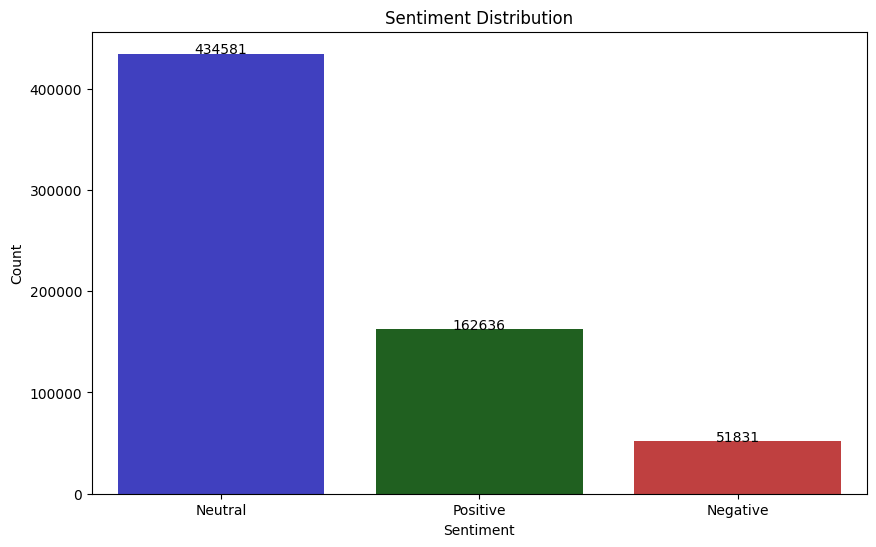

In [43]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.countplot(x='sentiment_label', data=df, palette =['b','g','r'], saturation=0.5)
# add count labels to the top of each bar
for i in range(len(df['sentiment_label'].value_counts())):
  count = df['sentiment_label'].value_counts()[i]
  plt.text(i, count+1, str(count), ha='center', fontsize=10)
plt.title('Sentiment Distribution')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.show()

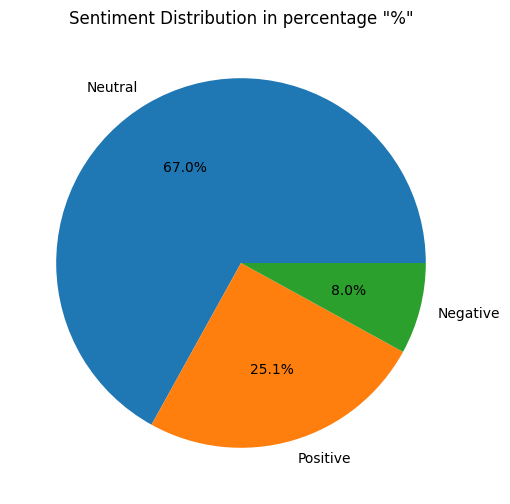

In [44]:
plt.figure(figsize=(6,6))
plt.pie(df['sentiment_label'].value_counts(), labels=df['sentiment_label'].value_counts().index, autopct='%1.1f%%')
plt.title('Sentiment Distribution in percentage "%"')
plt.show()

In [45]:
from plotly import graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
from collections import Counter

fig = go.Figure(go.Funnelarea(
      text = temp.sentiment_label,
      values = temp.text,
      title = {'position': 'top center', 'text': 'Funnel-Chart of Sentiment Distribution'}
      ))
# go.figsize=(6,6)
fig.show()

In [46]:
df.head(1)

,user_name,text,user_location,user_description,user_followers,date,hashtags,post_date,sentiment_score,sentiment_label
0,A Question A Day,What would be the output of the two print stat...,NaN,Simple and basic question on programming langu...,463,2023-04-03 13:29:05+00:00,"['python', 'programming', 'chatGPT']",2023-04-03,0.0,Neutral


In [47]:
# Word count in 'text'
df['word_count'] = df['text'].apply(lambda x: len(x.split()) if pd.notna(x) else 0)

# Compute uppercase word ratio
df['uppercase_ratio'] = df['text'].apply(lambda x: sum(1 for c in x if c.isupper()) / len(x) if pd.notna(x) else 0)

# Compute sentiment scores for 'user_description'
df['desc_sentiment_score'] = df['user_description'].apply(lambda x: vader.polarity_scores(x)['compound'] if pd.notna(x) else None)

# word count in Hashtags
df['wc_hashtag'] = df['hashtags'].apply(lambda x: len(x.split()) if pd.notna(x) else 0)

In [48]:
df.head(5)

,user_name,text,user_location,user_description,user_followers,date,hashtags,post_date,sentiment_score,sentiment_label,word_count,uppercase_ratio,desc_sentiment_score,wc_hashtag
0,A Question A Day,What would be the output of the two print stat...,NaN,Simple and basic question on programming langu...,463,2023-04-03 13:29:05+00:00,"['python', 'programming', 'chatGPT']",2023-04-03,0.0000,Neutral,20,0.079137,0.0000,3
1,Mark Virag,Of interest to my stock-trading tweeps...\n\nI...,North Dallas,"My interests are Automotive F&I (both), Machin...",777,2023-04-03 13:29:00+00:00,['ChatGPT'],2023-04-03,0.7845,Positive,29,0.062827,0.2500,1
2,The Decision Lab,"ChatGPT can write you a poem, answer philosoph...","Montréal, Québec",TDL is a behavioral design think tank. We appl...,4783,2023-04-03 13:28:53+00:00,,2023-04-03,0.0000,Neutral,35,0.032389,0.6249,0
3,Red Clover Advisors,Italy has given OpenAI 20 days to relay measur...,"Atlanta, GA",Privacy consultant helping companies have a pr...,357,2023-04-03 13:28:37+00:00,,2023-04-03,0.2023,Positive,32,0.110092,0.7506,0
4,Bitone Great,📉#Sell!📉\n🔥RSI over 85!🔥\n[#Bybit]\n👇 Recommen...,NaN,#ChatGPT (AI) powered Free Trading Signal! \nL...,1086,2023-04-03 13:28:27+00:00,"['Sell', 'Bybit', 'Short', 'SXPUSDT']",2023-04-03,0.0000,Neutral,25,0.197917,0.5972,4


Number of words in text vs Number of Hashtags

In [49]:
# Taking a random sample, data is large
sampled_df = df.sample(n=min(len(df), 10000), random_state=42)

# Prepare data for visualization
hist_data = [sampled_df['word_count'], sampled_df['wc_hashtag']]
group_labels = ['Text', 'Hashtags']

# Create distplot
fig = ff.create_distplot(hist_data, group_labels, show_curve=False)
fig.update_layout(
    title_text='Word Count Distribution: Text vs. Hashtags',
    autosize=False,
    width=700,
    height=550,
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [50]:
# df['word_count'].isna().sum()
# df['wc_hashtag'].isna().sum()

In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 649048 entries, 0 to 725834
Data columns (total 14 columns):
 #   Column                Non-Null Count   Dtype              
---  ------                --------------   -----              
 0   user_name             597701 non-null  object             
 1   text                  649048 non-null  object             
 2   user_location         281894 non-null  object             
 3   user_description      346450 non-null  object             
 4   user_followers        649048 non-null  int64              
 5   date                  307097 non-null  datetime64[ns, UTC]
 6   hashtags              649048 non-null  object             
 7   post_date             307097 non-null  object             
 8   sentiment_score       649048 non-null  float64            
 9   sentiment_label       649048 non-null  object             
 10  word_count            649048 non-null  int64              
 11  uppercase_ratio       649048 non-null  float64           

In [52]:
# df.drop(columns=['date'], inplace=True)

In [53]:
# df.describe()

Disrtibution of number of words in text vs number of words in Hashtags

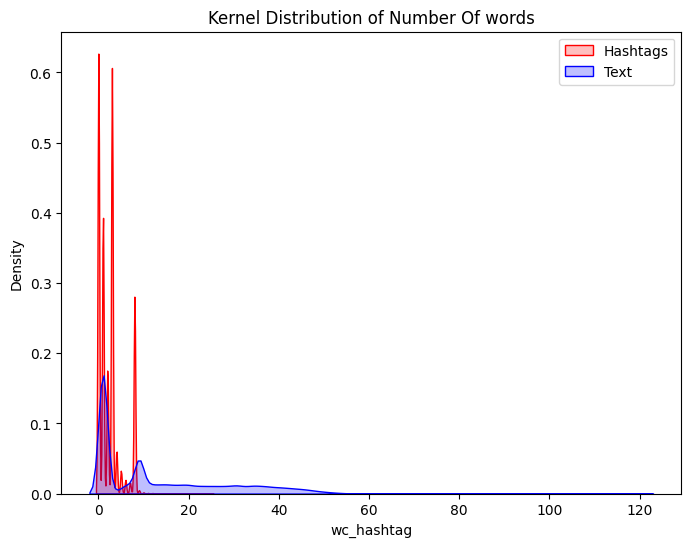

In [54]:
plt.figure(figsize=(8,6))
p1=sns.kdeplot(df['wc_hashtag'], fill=True, color="r").set_title('Kernel Distribution of Number Of words')
p1=sns.kdeplot(df['word_count'], fill=True, color="b")
p1=p1.legend(['Hashtags', 'Text'])

Calculating Jaccard Similarity

In [55]:
# Calculating Jaccard similarity between 'text' and 'Hashtags'
# it will give how much content of hashtags overlaps with text:

def jaccard_similarity(set1, set2):
  intersection = len(set1.intersection(set2))
  union = len(set1.union(set2))
  return intersection / union if union != 0 else 0

df['text_words'] = df['text'].fillna("").apply(lambda x: set(x.lower().split()))
df['hashtag_words'] = df['hashtags'].fillna("").apply(lambda x: set(x.lower().replace('#', '').split()))

df['text_hashtag_similarity'] = df.apply(lambda row: jaccard_similarity(row['text_words'], row['hashtag_words']), axis=1)

# Average similarity
print("Average Jaccard Similarity between text and hashtags:", df['text_hashtag_similarity'].mean())


Average Jaccard Similarity between text and hashtags: 1.7903298239123524e-06


In [56]:
df.shape

(649048, 17)

In [57]:
# df.describe()

In [58]:
# df.drop(columns=['filtered_hashtags'], inplace=True)
df.sample(3)

,user_name,text,user_location,user_description,user_followers,date,hashtags,post_date,sentiment_score,sentiment_label,word_count,uppercase_ratio,desc_sentiment_score,wc_hashtag,text_words,hashtag_words,text_hashtag_similarity
631685,Guido Brinkel,change is starting with the small things. #Cha...,Berlin,internet law & politics | technology | digital...,0,NaT,,NaT,0.0000,Neutral,9,0.121622,0.0000,0,"{starting, things., the, #chatgpt, small, is, ...",{},0.0
95861,✋ᴅᴀᴠɪᴅ,🎉 Ready to join the revolution? Invest in #Cha...,NaN,🏄‍Surf lover\n#nftdrop,3,2023-02-26 07:59:31+00:00,['ChatGPT'],2023-02-26,0.5719,Positive,32,0.158371,0.5859,1,"{$joe, future, a, be, #web3, coin, ready, join...",{['chatgpt']},0.0
149500,#ethereum #btc #bullishly,nan,NaN,NaN,0,NaT,#ethereum #btc #bullishly,NaT,0.0000,Neutral,1,0.000000,NaN,3,{nan},"{ethereum, btc, bullishly}",0.0


Cleaning hashtags to it a consistent data type

In [59]:
# To get top hashtags we need to first preprocess this column as it contains inconsistent data format...

def clean_hashtags(entry):
  if isinstance(entry, list):
    return list
  elif isinstance(entry, str):
    return [tag.lower().strip('#') for tag in entry.split() if len(tag) > 1 and not tag.isdigit()]
  else:
    return []

df['cleaned_hashtags'] = df['hashtags'].apply(clean_hashtags)

# Display the cleaned DataFrame
print(df[['hashtags', 'cleaned_hashtags']].head(4))



                               hashtags  \
0  ['python', 'programming', 'chatGPT']   
1                           ['ChatGPT']   
2                                         
3                                         

                           cleaned_hashtags  
0  [['python',, 'programming',, 'chatgpt']]  
1                             [['chatgpt']]  
2                                        []  
3                                        []  


In [60]:
df.shape

(649048, 18)

In [61]:
import ast

def clean_hashtags(entry):
    try:
        # Parse the string into a Python object (handles strings like "['tag1', 'tag2']")
        if isinstance(entry, str):
            entry = ast.literal_eval(entry)

        # Flatten nested lists, if any
        if isinstance(entry, list):
            flattened = []
            for item in entry:
                if isinstance(item, list):
                    flattened.extend(item)  # Unwrap nested lists
                else:
                    flattened.append(item)

            # Remove stray commas and empty entries
            cleaned = [str(tag).strip() for tag in flattened if tag and tag != ","]
            return cleaned
    except (ValueError, SyntaxError):
        # If parsing fails, return an empty list
        return []

    # If not a list or string, return an empty list
    return []

# Apply the cleaning function to the hashtags column
df['cleaned_hashtags'] = df['hashtags'].apply(clean_hashtags)

# Remove rows where hashtags become empty
df = df[df['cleaned_hashtags'].apply(len) > 0]

# Display the cleaned DataFrame
print(df[['cleaned_hashtags']])


                      cleaned_hashtags
0       [python, programming, chatGPT]
1                            [ChatGPT]
4        [Sell, Bybit, Short, SXPUSDT]
7            [ChatGPT, OnlineBusiness]
8                   [politicalscience]
...                                ...
725829                       [ChatGPT]
725831                       [ChatGPT]
725832                       [ChatGPT]
725833                 [ChatGPT, GPT3]
725834                  [ChatGPT, LLM]

[242065 rows x 1 columns]


In [62]:
df.shape

(242065, 18)

In [63]:
# Convert all hashtags in the 'cleaned_hashtags' column to lowercase
df['cleaned_hashtags'] = df['cleaned_hashtags'].apply(lambda x: [tag.lower() for tag in x])

# Verify the changes
print(df['cleaned_hashtags'].head())


0    [python, programming, chatgpt]
1                         [chatgpt]
4     [sell, bybit, short, sxpusdt]
7         [chatgpt, onlinebusiness]
8                [politicalscience]
Name: cleaned_hashtags, dtype: object


In [64]:
# Flatten the list of hashtags across all rows
all_hashtags = [tag for tags_list in df['cleaned_hashtags'] for tag in tags_list]

# Count the occurrences of each hashtag
hashtag_counts = Counter(all_hashtags)

# Get the top 10 hashtags
top_hashtags = hashtag_counts.most_common(15)

# Convert to DataFrame for visualization
top_hashtags_df = pd.DataFrame(top_hashtags, columns=['Hashtag', 'Count'])

print(top_hashtags_df)


                   Hashtag   Count
0                  chatgpt  208154
1                       ai   41062
2                   openai   13633
3   artificialintelligence    5795
4                      nft    5719
5                  airdrop    5082
6                   google    4716
7                   crypto    4484
8                     gpt4    4334
9                      gpt    4137
10              midjourney    3125
11               microsoft    3070
12                 chatbot    2976
13                    bing    2656
14                    bard    2596


Top most mentioned hashtags

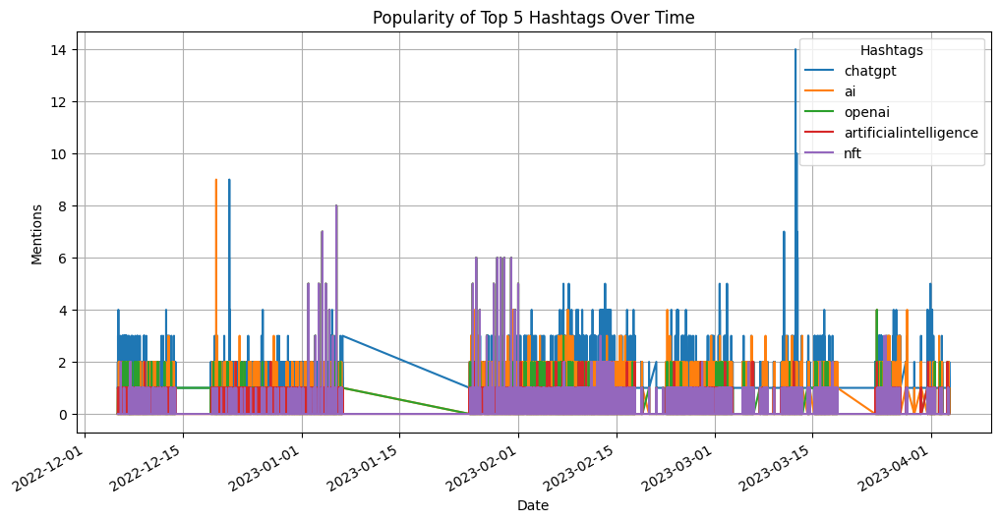

In [65]:
# Select the top 5 hashtags
top_5_hashtags = [hashtag for hashtag, _ in hashtag_counts.most_common(5)]

# Create a column for hashtags by date
df['date'] = pd.to_datetime(df['date'])  # Ensure date is in datetime format

# Count hashtags by date
hashtag_trends = df.explode('cleaned_hashtags')  # Separate each hashtag into a new row
hashtag_trends = hashtag_trends[hashtag_trends['cleaned_hashtags'].isin(top_5_hashtags)]
hashtag_trends = hashtag_trends.groupby(['date', 'cleaned_hashtags']).size().reset_index(name='Count')

# Pivot the data for plotting
hashtag_pivot = hashtag_trends.pivot(index='date', columns='cleaned_hashtags', values='Count').fillna(0)

# Plot the trends
hashtag_pivot[top_5_hashtags].plot(figsize=(12, 6))
plt.title("Popularity of Top 5 Hashtags Over Time")
plt.xlabel("Date")
plt.ylabel("Mentions")
plt.legend(title="Hashtags")
plt.grid(True)
plt.show()


In [66]:
# Plot interactive line chart
fig = px.line(
    hashtag_trends,
    x='date',
    y='Count',
    color='cleaned_hashtags',
    title="Top 5 Hashtags Popularity Over Time",
    labels={'date': 'Date', 'Count': 'Mentions', 'cleaned_hashtags': 'Hashtags'}
)
fig.update_xaxes(rangeslider_visible=True)
fig.show()


Time-Based Activity Analysis

In [67]:
df['tweet_date'] = df['date'].dt.date
df['day'] = df['date'].dt.day_name()
df['hour'] = df['date'].dt.hour

In [68]:
df.sample(3)

,user_name,text,user_location,user_description,user_followers,date,hashtags,post_date,sentiment_score,sentiment_label,...,uppercase_ratio,desc_sentiment_score,wc_hashtag,text_words,hashtag_words,text_hashtag_similarity,cleaned_hashtags,tweet_date,day,hour
657626,WIZZ.,"""Create an image of a ancient indian characte...",NaN,#Student. \n#artist.. \n#Nft . Metaver...,1,2023-01-05 15:55:50+00:00,"['AIArtwork', 'indian']",2023-01-05,0.2732,Positive,...,0.086093,0.0000,2,"{image, #aiartwork, costume."", https://t.co/l6...","{'indian'], ['aiartwork',}",0.0,"[aiartwork, indian]",2023-01-05,Thursday,15
47419,Penn LDI,"For a new ""Not the Last Word"" in @Clinorthop, ...","Philadelphia, Pa.","Leonard Davis Institute of Health Economics, @...",8364,2023-03-15 14:49:01+00:00,['ChatGPT'],2023-03-15,0.1280,Positive,...,0.088496,0.4939,1,"{here:, for, that, ldi, is, on, a, https://t.c...",{['chatgpt']},0.0,[chatgpt],2023-03-15,Wednesday,14
694014,c◎llΞct◎r of idΞas,"When asked how to make chocolate chip cookies,...","Zurich, Switzerland",As a digital witchmaster I apply internet alch...,126,2022-12-12 13:42:00+00:00,"['ChatGPT', 'Google']",2022-12-12,0.3818,Positive,...,0.051948,0.4767,2,"{links, that, chip, you, cookies,, up, a, #llm...","{'google'], ['chatgpt',}",0.0,"[chatgpt, google]",2022-12-12,Monday,13


In [69]:
# Group by date to count tweets per day
tweets_per_day = df.groupby('tweet_date').size()
print(tweets_per_day)

# Group by hour to analyze hourly trends
tweets_per_hour = df.groupby('hour').size()
print(tweets_per_hour)

# Group by day of the week
tweets_per_weekday = df.groupby('day').size()
print(tweets_per_weekday)

tweet_date
2022-12-05    1855
2022-12-06    5714
2022-12-07    4388
2022-12-08    4346
2022-12-09    4198
              ... 
2023-03-30     425
2023-03-31    4272
2023-04-01    3006
2023-04-02    1154
2023-04-03    1009
Length: 91, dtype: int64
hour
0      7775
1      7636
2      7807
3      7603
4      7618
5      7748
6      8086
7      9004
8      9530
9     10152
10    10677
11    11687
12    13131
13    13966
14    12803
15    12549
16    12334
17    11873
18    11916
19    11619
20    10788
21     9523
22     8868
23     7372
dtype: int64
day
Friday       42324
Monday       31809
Saturday     28793
Sunday       25250
Thursday     39207
Tuesday      35172
Wednesday    39510
dtype: int64


More time series analysis on tweets

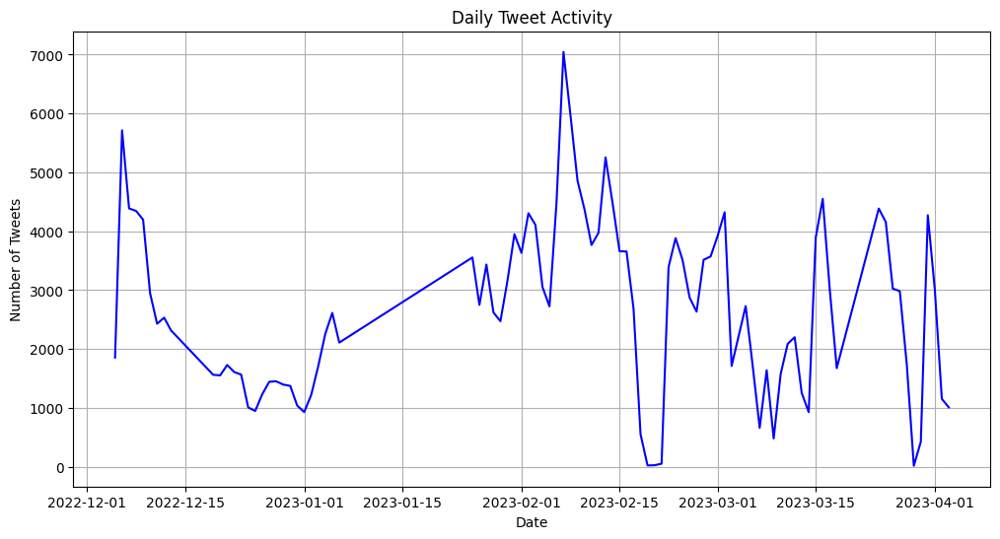

In [70]:
# Plot daily tweet activity
plt.figure(figsize=(12, 6))
tweets_per_day.plot(kind='line', color='blue')
plt.title('Daily Tweet Activity')
plt.xlabel('Date')
plt.ylabel('Number of Tweets')
plt.grid()
plt.show()

In [71]:
# Group data by date
tweets_per_day = df.groupby('tweet_date').size().reset_index(name='tweet_count')

# Plot interactive line chart
fig = px.line(tweets_per_day,
              x='tweet_date',
              y='tweet_count',
              title='Daily Tweet Activity',
              labels={'tweet_date': 'Date', 'tweet_count': 'Number of Tweets'},
              template='plotly_dark')

fig.update_layout(
    xaxis=dict(title='Date'),
    yaxis=dict(title='Number of Tweets'),
    autosize=False,
    width=1000,
    height=600
)
fig.show()

In [72]:
# Group data by hour
tweets_per_hour = df.groupby('hour').size().reset_index(name='tweet_count')

# Plot interactive bar chart
fig = px.bar(tweets_per_hour,
             x='hour',
             y='tweet_count',
             title='Hourly Tweet Activity',
             labels={'hour': 'Hour of the Day', 'tweet_count': 'Number of Tweets'},
             template='plotly_dark')

fig.update_layout(
    xaxis=dict(title='Hour of the Day'),
    yaxis=dict(title='Number of Tweets'),
    autosize=False,
    width=1000,
    height=600
)
fig.show()

In [73]:
# Group data by day of the week
tweets_per_weekday = df.groupby('day').size().reset_index(name='tweet_count')

# Ensure the correct weekday order
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
tweets_per_weekday['day'] = pd.Categorical(tweets_per_weekday['day'], categories=weekday_order, ordered=True)
tweets_per_weekday = tweets_per_weekday.sort_values('day')

# Plot interactive bar chart
fig = px.bar(tweets_per_weekday,
             x='day',
             y='tweet_count',
             title='Tweet Activity by Day of the Week',
             labels={'day_of_week': 'Day of the Week', 'tweet_count': 'Number of Tweets'},
             template='plotly_dark')

fig.update_layout(
    xaxis=dict(title='Day of the Week'),
    yaxis=dict(title='Number of Tweets'),
    autosize=False,
    width=1000,
    height=600
)
fig.show()


In [74]:
# Create a pivot table for heatmap
heatmap_data = df.pivot_table(index='day', columns='hour', values='date', aggfunc='count', fill_value=0)

# Ensure correct weekday order
heatmap_data = heatmap_data.reindex(weekday_order)

# Plot interactive heatmap
fig = px.imshow(heatmap_data,
                labels={'x': 'Hour of the Day', 'y': 'Day of the Week', 'color': 'Tweet Count'},
                title='Tweet Activity Heatmap: Hour vs. Day',
                color_continuous_scale='Viridis',
                template='plotly_dark')

fig.update_layout(
    autosize=False,
    width=1000,
    height=600
)
fig.show()


In [75]:
df.shape

(242065, 21)

Analysis of tweets based on sentiment labels

In [76]:
# Filter for Neutral sentiment and group by hour
positive_tweets_hourly = df[df['sentiment_label'] == 'Neutral'].groupby('day').size().reset_index(name='tweet_count')

# Plot
fig = px.bar(positive_tweets_hourly,
             x='day',
             y='tweet_count',
             title='Neutral Tweet Activity by Day',
             labels={'day': 'Day of week', 'tweet_count': 'Number of Tweets'},
             template='plotly_dark')

fig.update_layout(
    xaxis=dict(title='Day of week'),
    yaxis=dict(title='Number of Tweets'),
    autosize=False,
    width=1000,
    height=600
)
fig.show()


In [77]:
# Filter for positive sentiment and group by hour
positive_tweets_hourly = df[df['sentiment_label'] == 'Positive'].groupby('day').size().reset_index(name='tweet_count')

# Plot
fig = px.bar(positive_tweets_hourly,
             x='day',
             y='tweet_count',
             title='Positive Tweet Activity by Day',
             labels={'day': 'Day of week', 'tweet_count': 'Number of Tweets'},
             template='plotly_dark')

fig.update_layout(
    xaxis=dict(title='Day of week'),
    yaxis=dict(title='Number of Tweets'),
    autosize=False,
    width=1000,
    height=600
)
fig.show()


In [78]:
# Filter for Negative sentiment and group by hour
positive_tweets_hourly = df[df['sentiment_label'] == 'Negative'].groupby('day').size().reset_index(name='tweet_count')

# Plot
fig = px.bar(positive_tweets_hourly,
             x='day',
             y='tweet_count',
             title='Negative Tweet Activity by Day',
             labels={'day': 'Day of week', 'tweet_count': 'Number of Tweets'},
             template='plotly_dark')

fig.update_layout(
    xaxis=dict(title='Day of week'),
    yaxis=dict(title='Number of Tweets'),
    autosize=False,
    width=1000,
    height=600
)
fig.show()


Tweets Sentiment Analysis Based on Location

In [79]:
df['user_location']=df['user_location'].fillna('')

positive_tweet=df[df['sentiment_label']=='Positive'].reset_index()
negative_tweet=df[df['sentiment_label']=='Negative'].reset_index()
neutral_tweet=df[df['sentiment_label']=='Neutral'].reset_index()

pos_location=positive_tweet['user_location']
neg_location=negative_tweet['user_location']
neu_location=neutral_tweet['user_location']

common=set(pos_location).intersection(set(neg_location)).intersection(set(neu_location))
common_list=list(common)
print(common_list)

['', 'MadHareMerch.xyz', 'Pewaukee, WI', 'Global.', 'Cambridge & Warsaw ', 'Alaska, USA', 'City of London and Surrey UK', 'Kuyūng-bort, Melbourne, Aus', 'New Jersey', 'Jamshedpur, India', '(Central) Europe', 'In his own head', 'Bay Area CA', 'Los Angeles, CA, USA', 'Kenosha, WI', 'Montevideo, Uruguay', 'Karlsruhe', 'San Francisco CA & Chicago IL', 'Washington, D.C.', '🌌', 'Amersfoort, the Netherlands', 'Ciudad Autónoma de Buenos Aire', 'Alberta, Canada', 'Rotterdam, Nederland', 'Missoula, Montana', 'Taipei', 'Nomad', 'Web 3.0', 'Edmonton, AB -Treaty 6- Canada', 'Victoria, Canada', 'Seattle, Earth', 'McLean, VA', 'Corona, CA', 'Indianapolis, Indiana USA', 'Brighton', 'Tehran, Iran', 'Ibiza. Amsterdam. Tel-Aviv. ', '🚀', 'Shenzhen', 'Richmond, BC, Canada', 'Virtual', 'Grand Rapids, Michigan', 'Cairo, Egypt', 'Mars Rover', 'New Delhi, India', 'SHIB: The MV - SHIBOSHI ZONE', 'Plymouth, England', 'Meta-America CA FL NY SC TX WA', 'North Bay, Ontario', 'United States of Smash', 'Schwetzingen,

In [80]:
df.shape

(242065, 21)

In [94]:
# NEGATIVE
common_words=neg_location.value_counts().drop(labels=common_list)[:20].rename_axis('common negative location').reset_index(name='count')
fig=px.treemap(common_words,path=['common negative location'],values='count',title='20 Top Unique negative Tweets Location')
fig.show()

In [95]:
# POSITIVE
common_words=pos_location.value_counts().drop(labels=common_list)[:20].rename_axis('common positive location').reset_index(name='count')
fig=px.treemap(common_words,path=['common positive location'],values='count',title='20 Top Unique positive Location')
fig.show()

In [96]:
# NEUTRAL
common_words=neu_location.value_counts().drop(labels=common_list)[:20].rename_axis('common neutral location').reset_index(name='count')
fig=px.treemap(common_words,path=['common neutral location'],values='count',title='20 top Unique Neutral Location')
fig.show()

Users having most followers

Text(0.5, 1.0, 'Followers')

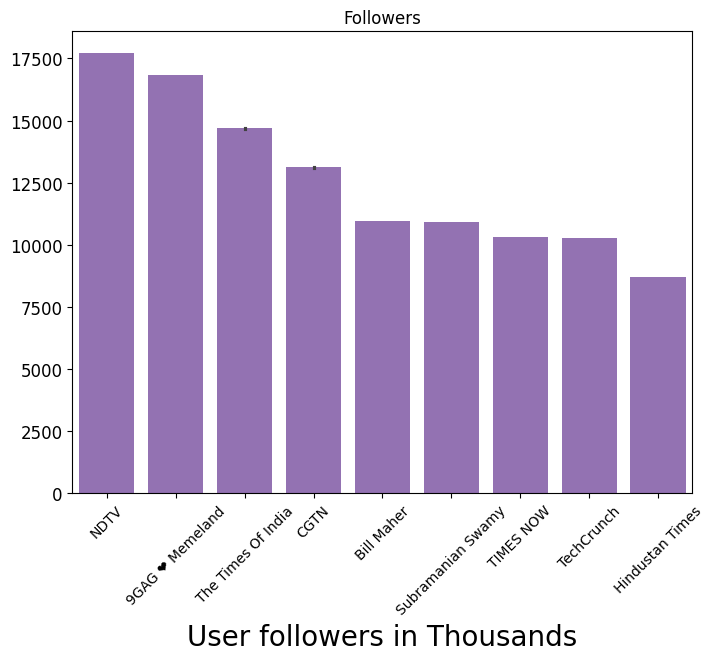

In [84]:

most_pop=df.sort_values('user_followers',ascending=False)[['user_name','user_followers']].head(150)

most_pop['user_followers1']=most_pop['user_followers']/1000


plt.figure(figsize=(8,6))

sns.barplot(data=most_pop, y='user_followers1',x='user_name',color='#9467bd')
plt.xticks(fontsize=10,rotation=45)
plt.yticks(fontsize=12,rotation=0)
plt.xlabel('User followers in Thousands',fontsize=20)
plt.ylabel('')
plt.title('Followers',fontsize=12)

In [85]:
# Select only top 10 users and ensure unique names
most_pop_top10 = df.sort_values('user_followers', ascending=False)[['user_name', 'user_followers']].drop_duplicates('user_name').head(10)
most_pop_top10['user_followers1'] = most_pop_top10['user_followers'] / 1000  # Convert to thousands

# Create the bar plot
fig = px.bar(
    most_pop_top10,
    x='user_name',
    y='user_followers1',
    title='Top 10 Users by Followers',
    labels={'user_name': 'User Name', 'user_followers1': 'Followers (in Thousands)'},
    color='user_followers1',  # Add color intensity based on follower count
    text='user_followers1',  # Display the follower count on bars
)

# Update layout for readability
fig.update_layout(
    xaxis=dict(title='User Name', tickangle=45, tickfont=dict(size=12)),
    yaxis=dict(title='Followers (in Thousands)', tickfont=dict(size=12)),
    autosize=False,
    width=800,
    height=500,
    title_font=dict(size=20),
)

# Show the figure
fig.show()


In [86]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 242065 entries, 0 to 725834
Data columns (total 21 columns):
 #   Column                   Non-Null Count   Dtype              
---  ------                   --------------   -----              
 0   user_name                242059 non-null  object             
 1   text                     242065 non-null  object             
 2   user_location            242065 non-null  object             
 3   user_description         224465 non-null  object             
 4   user_followers           242065 non-null  int64              
 5   date                     242065 non-null  datetime64[ns, UTC]
 6   hashtags                 242065 non-null  object             
 7   post_date                242065 non-null  object             
 8   sentiment_score          242065 non-null  float64            
 9   sentiment_label          242065 non-null  object             
 10  word_count               242065 non-null  int64              
 11  uppercase_ratio   

Cleaning the text column

In [87]:
def remove_line_breaks(text):
    text = text.replace('\r', ' ').replace('\n', ' ')
    return text

#remove punctuation
def remove_punctuation(text):
    re_replacements = re.compile("__[A-Z]+__")  # such as __NAME__, __LINK__
    re_punctuation = re.compile("[%s]" % re.escape(string.punctuation))
    '''Escape all the characters in pattern except ASCII letters and numbers'''
    tokens = word_tokenize(text)
    tokens_zero_punctuation = []
    for token in tokens:
        if not re_replacements.match(token):
            token = re_punctuation.sub(" ", token)
        tokens_zero_punctuation.append(token)
    return ' '.join(tokens_zero_punctuation)


def remove_special_characters(text):
    text = re.sub('[^a-zA-z0-9\s]', '', text)
    return text

def lowercase(text):
    text_low = [token.lower() for token in word_tokenize(text)]
    return ' '.join(text_low)
def remove_stopwords(text):
    stop = set(stopwords.words('english'))
    word_tokens = nltk.word_tokenize(text)
    text = " ".join([word for word in word_tokens if word not in stop])
    return text

def remove_one_character_words(text):
    '''Remove words from dataset that contain only 1 character'''
    text_high_use = [token for token in word_tokenize(text) if len(token)>1]
    return ' '.join(text_high_use)

# Stemming with 'Snowball stemmer" package
def stem(text):
    stemmer = nltk.stem.snowball.SnowballStemmer('english')
    text_stemmed = [stemmer.stem(token) for token in word_tokenize(text)]
    return ' '.join(text_stemmed)

def lemma(text):
    wordnet_lemmatizer = WordNetLemmatizer()
    word_tokens = nltk.word_tokenize(text)
    text_lemma = " ".join([wordnet_lemmatizer.lemmatize(word) for word in word_tokens])
    return ' '.join(text_lemma)

def sentence_word(text):
    word_tokens = nltk.word_tokenize(text)
    return word_tokens
#break paragraphs to sentence token
def paragraph_sentence(text):
    sent_token = nltk.sent_tokenize(text)
    return sent_token

def tokenize(text):
    """Return a list of words in a text."""
    return re.findall(r'\w+', text)

def remove_numbers(text):
    no_nums = re.sub(r'\d+', '', text)
    return ''.join(no_nums)

def clean_text(text):
    _steps = [
    remove_line_breaks,
    remove_one_character_words,
    remove_special_characters,
    lowercase,
    remove_punctuation,
    remove_stopwords,
    stem,
    remove_numbers
]
    for step in _steps:
        text=step(text)
    return text

In [88]:
df['text']=df['text'].astype(str)
df['text']=[x.replace(':',' ') for x in df['text']]

In [89]:
def clean_text(text):
    if isinstance(text, str): # check if input is a string
        # remove URLs
        text = re.sub(r'http\S+', '', text)
        text = re.sub(r'https\S+', '', text)
        text = re.sub(r'www.\S+', '', text)
        # remove punctuations
        text = text.translate(str.maketrans('', '', string.punctuation))
        # convert text to lowercase
        text = text.lower()
        return text
    else:
        return '' # return empty string for non-string inputs

In [90]:
df['clean_text'] = df['text'].apply(clean_text)
df.loc[:,['text','clean_text']]

,text,clean_text
0,What would be the output of the two print stat...,what would be the output of the two print stat...
1,Of interest to my stock-trading tweeps...\n\nI...,of interest to my stocktrading tweeps\n\ni gav...
4,📉#Sell!📉\n🔥RSI over 85!🔥\n[#Bybit]\n👇 Recommen...,📉sell📉\n🔥rsi over 85🔥\nbybit\n👇 recommendation...
7,I'm setting up a new YouTube channel to teach ...,im setting up a new youtube channel to teach p...
8,ChatGPT becomes a new target for right-wing co...,chatgpt becomes a new target for rightwing com...
...,...,...
725829,"ChatGPT is the biggest, smartest brain 🧠 in th...",chatgpt is the biggest smartest brain 🧠 in the...
725831,Iterating back-and-forth with tools like #Chat...,iterating backandforth with tools like chatgpt...
725832,Russel vs ChatGPT. It's also funny that it tak...,russel vs chatgpt its also funny that it takes...
725833,Was just wondering is there any difference bet...,was just wondering is there any difference bet...


In [91]:
df.isna().sum()

,0
user_name,6
text,0
user_location,0
user_description,17600
user_followers,0
date,0
hashtags,0
post_date,0
sentiment_score,0
sentiment_label,0


In [92]:
words=df['clean_text'].values
ls=[]
for i in words:
    ls.append(str(i))

WordCloud

(-0.5, 1599.5, 799.5, -0.5)

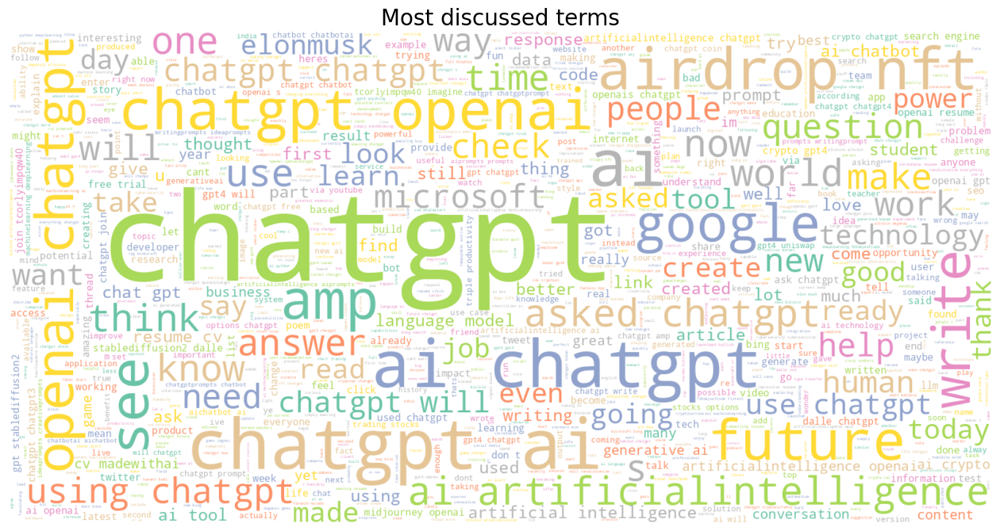

In [93]:
plt.figure(figsize=(16,12))
wc=WordCloud(background_color='white',colormap='Set2',max_words=1000,max_font_size=200,width=1600,height=800)
wc.generate(" ".join(ls))
plt.title('Most discussed terms',fontsize=20)
plt.imshow(wc.recolor(colormap='Set2',random_state=17),alpha=0.98,interpolation='bilinear')
plt.axis('off')